<a href="https://colab.research.google.com/github/Linkbreathe/DL4CR/blob/ruiqi/tg3k_preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
SEED = 42

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp "/content/drive/MyDrive/tg3k.zip" .

In [ ]:
#load file
!unzip tg3k.zip

流式输出内容被截断，只能显示最后 5000 行内容。
  inflating: tg3k/thyroid-image/2171.jpg  
  inflating: tg3k/thyroid-image/2172.jpg  
  inflating: tg3k/thyroid-image/2173.jpg  
  inflating: tg3k/thyroid-image/2174.jpg  
  inflating: tg3k/thyroid-image/2175.jpg  
  inflating: tg3k/thyroid-image/2176.jpg  
  inflating: tg3k/thyroid-image/2177.jpg  
  inflating: tg3k/thyroid-image/2178.jpg  
  inflating: tg3k/thyroid-image/2179.jpg  
  inflating: tg3k/thyroid-image/2180.jpg  
  inflating: tg3k/thyroid-image/2181.jpg  
  inflating: tg3k/thyroid-image/2182.jpg  
  inflating: tg3k/thyroid-image/2183.jpg  
  inflating: tg3k/thyroid-image/2184.jpg  
  inflating: tg3k/thyroid-image/2185.jpg  
  inflating: tg3k/thyroid-image/2186.jpg  
  inflating: tg3k/thyroid-image/2187.jpg  
  inflating: tg3k/thyroid-image/2188.jpg  
  inflating: tg3k/thyroid-image/2189.jpg  
  inflating: tg3k/thyroid-image/2190.jpg  
  inflating: tg3k/thyroid-image/2191.jpg  
  inflating: tg3k/thyroid-image/2192.jpg  
  inflating: tg3k/thyroid-i

In [ ]:
#create a dataframe, cols: path, is_mask
root_dir = "tg3k/"

In [ ]:
import os
import pandas as pd

root_dir = "tg3k/thyroid-image" # Moved definition here for robustness

# List all files in the root_dir and its subdirectories
all_files = []
for dirpath, dirnames, filenames in os.walk(root_dir):
    for filename in filenames:
        all_files.append(os.path.join(dirpath, filename))

# Create DataFrame
df = pd.DataFrame({
    'path': all_files
})

# Display the first 5 rows of the DataFrame
display(df.head())

#save the file


,path
0,tg3k/thyroid-image/0669.jpg
1,tg3k/thyroid-image/3580.jpg
2,tg3k/thyroid-image/3524.jpg
3,tg3k/thyroid-image/2485.jpg
4,tg3k/thyroid-image/1035.jpg


In [ ]:
import json
with open("tg3k/tg3k-trainval.json", "r") as f:
    splits = json.load(f)
val_ids = set(splits["val"])
train_ids = set(splits["train"])
#transform the val and train ids into 4 digits

val_ids = [str(id).zfill(4) for id in val_ids]
train_ids = [str(id).zfill(4) for id in train_ids]
#if the num of image name in val or train ids then label it
df['train_val'] = df['path'].apply(lambda x: 'train' if x.split('/')[-1].split('.')[0] in train_ids else 'val')


In [ ]:
df.to_csv('tg3k/thyroid_index.csv', index=False)

In [ ]:
import os
from pathlib import Path
import random

import numpy as np
import pandas as pd
from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
import cv2
import matplotlib.pyplot as plt

# Make plots inline if you are in Jupyter
# %matplotlib inline

# -----------------------------
# Reproducibility
# -----------------------------
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# -----------------------------
# Device
# -----------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [ ]:
#inspect the data
df = pd.read_csv('tg3k/thyroid_index.csv')
df.head()
print("image shape:", df.shape)

image shape: (3585, 1)


In [ ]:
def get_mask_path_from_img_path(img_path) -> Path:
    img_path = Path(img_path)
    mask_path = img_path.parent.parent / 'thyroid-mask' / img_path.name
    return mask_path
print(get_mask_path_from_img_path(df.iloc[0]['path']))


tg3k/thyroid-mask/0669.jpg


In [ ]:
def get_image_path_from_row(path_str) -> Path:
    return Path(path_str)

def get_mask_path_from_row(path_str) -> Path:
    return get_mask_path_from_img_path(path_str)

def load_image_as_array(path: Path) -> np.ndarray:
    """
    Load a PNG as a grayscale numpy array of shape (H, W), dtype uint8.

    We do NOT normalize or resize here. That will be handled by Albumentations.
    """
    if not path.exists():
        raise FileNotFoundError(f"Image file not found: {path}")
    img = Image.open(path).convert("L")  # "L" = single-channel grayscale
    return np.array(img)
def load_mask_as_array(path: Path) -> np.ndarray:
    if not path.exists():
        raise FileNotFoundError(f"Mask file not found: {path}")
    mask = Image.open(path).convert("L")
    return np.array(mask)
# Quick sanity check: try loading one random image
print("\nSanity check paths:")
sample_row_series = df.sample(1).iloc[0]
# For the sanity check, sample_row_series is a pandas Series, so we access 'path' as before
print("Image path:", get_image_path_from_row(sample_row_series['path']))
print("Mask path :", get_mask_path_from_row(sample_row_series['path']))


Sanity check paths:
Image path: tg3k/thyroid-image/3377.jpg
Mask path : tg3k/thyroid-mask/3377.jpg


In [ ]:
#check if all images and masks have the same shape
image_paths = df['path']
mask_paths = df['path']
image_shapes = [cv2.imread(path).shape for path in image_paths]
mask_shapes = [cv2.imread(path).shape for path in mask_paths]
print("Image shapes:", set(image_shapes))
print("Mask shapes:", set(mask_shapes))

#which means we should normalize the image to the same shape

Image shapes: {(194, 258, 3), (209, 214, 3), (187, 241, 3), (238, 251, 3), (204, 240, 3), (174, 241, 3), (191, 278, 3), (213, 241, 3), (207, 281, 3), (194, 242, 3), (182, 270, 3), (178, 234, 3), (191, 265, 3), (193, 325, 3), (209, 216, 3)}
Mask shapes: {(194, 258, 3), (209, 214, 3), (187, 241, 3), (238, 251, 3), (204, 240, 3), (174, 241, 3), (191, 278, 3), (213, 241, 3), (207, 281, 3), (194, 242, 3), (182, 270, 3), (178, 234, 3), (191, 265, 3), (193, 325, 3), (209, 216, 3)}


In [ ]:
#check the range of pixels in images and masks
image_paths_series = df['path'] # This Series contains all image file paths

image_min_vals = []
image_max_vals = []
mask_min_vals = []
mask_max_vals = []

print("Processing image pixel ranges...")
for img_path_str in image_paths_series:
    # Convert string path to Path object before passing to load_image_as_array
    img_array = load_image_as_array(Path(img_path_str))
    image_min_vals.append(np.min(img_array))
    image_max_vals.append(np.max(img_array))

print("Processing mask pixel ranges...")
for img_path_str in image_paths_series:
    # Derive the corresponding mask path from the image path
    mask_path = get_mask_path_from_img_path(img_path_str)
    # Load the mask as an array
    mask_array = load_mask_as_array(mask_path)
    mask_min_vals.append(np.min(mask_array))
    mask_max_vals.append(np.max(mask_array))

print("Overall image pixel value range (min, max):", (min(image_min_vals), max(image_max_vals)))
print("Overall mask pixel value range (min, max):", (min(mask_min_vals), max(mask_max_vals)))

Processing image pixel ranges...
Processing mask pixel ranges...
Overall image pixel value range (min, max): (np.uint8(0), np.uint8(255))
Overall mask pixel value range (min, max): (np.uint8(0), np.uint8(255))


In [ ]:
TARGET_HEIGHT = 224
TARGET_WIDTH = 320
class Crop_noise(A.DualTransform):
    def __init__(self, crop_height = 10, always_apply=True, p=1.0):
        super(Crop_noise, self).__init__(always_apply, p)
        self.crop_height = crop_height

    def apply(self, img, **params):
        h, w = img.shape[:2]
        #crop our the upper 'crop_height' rows
        top = self.crop_height
        return img[top:, :]

    def apply_to_mask(self, mask, **params):
        return self.apply(mask, **params)


def get_segmentation_train_transforms_split():
    # Transforms that apply to both image and mask (geometric, etc.)
    common_transforms = A.Compose([
        Crop_noise(crop_height=20),
        A.Resize(height=TARGET_HEIGHT, width=TARGET_WIDTH),
        A.HorizontalFlip(p=0.5),
        A.Rotate(limit=5, border_mode=cv2.BORDER_REFLECT_101, p=0.5),
    ], additional_targets={"mask": "mask"})

    # Transforms that apply only to the image (pixel-level augmentations, normalization)
    image_transforms = A.Compose([
        A.Normalize(mean=(0.5,), std=(0.25,)), # Image normalization
        ToTensorV2(), # Convert image to tensor
    ])

    # Transforms that apply only to the mask (just convert to tensor and scale to [0,1])
    mask_transforms = A.Compose([
        #A.Lambda(image=lambda m, **kwargs: (m > 127).astype(np.uint8)),
        A.ToFloat(max_value=255.0),
        ToTensorV2(), # Converts uint8 mask to float32 [0.0, 1.0] if max_value is 255
    ])
    return common_transforms, image_transforms, mask_transforms


def get_segmentation_val_transforms_split():
    # Transforms that apply to both image and mask
    common_transforms = A.Compose([
        Crop_noise(crop_height=20),
        # A.LongestMaxSize(max_size=640), # Removed as Resize handles dimension
        A.Resize(height=TARGET_HEIGHT, width=TARGET_WIDTH), # Ensure consistent size
        ])

    # Transforms that apply only to the image
    image_transforms = A.Compose([
        A.Normalize(mean=(0.5,), std=(0.25,)), # Image normalization
        ToTensorV2(), # Convert image to tensor
    ])

    # Transforms that apply only to the mask
    mask_transforms = A.Compose([
        A.ToFloat(max_value=255.0),
        ToTensorV2(), # Converts uint8 mask to float32 [0.0, 1.0]
    ])
    return common_transforms, image_transforms, mask_transforms



print("MIM pretrain transform created.")

train_common_transforms, train_image_transforms, train_mask_transforms = get_segmentation_train_transforms_split()
val_common_transforms, val_image_transforms, val_mask_transforms = get_segmentation_val_transforms_split()
print("Segmentation transforms created.")

MIM pretrain transform created.
Segmentation transforms created.


In [ ]:
class ThyroidDatasetSupervised(Dataset):
  def __init__(self, df_seg: pd.DataFrame, common_transforms: A.Compose, image_transforms: A.Compose, mask_transforms: A.Compose):
      self.df = df_seg.reset_index(drop=True)
      self.common_transforms = common_transforms
      self.image_transforms = image_transforms
      self.mask_transforms = mask_transforms

  def __len__(self):
      return len(self.df)

  def __getitem__(self, idx: int):
      row = self.df.iloc[idx]

      img_path = get_image_path_from_row(row['path'])
      mask_path = get_mask_path_from_img_path(img_path)

      img_np = load_image_as_array(img_path)   # (H, W), uint8
      mask_np = load_mask_as_array(mask_path)  # (H, W), uint8

      # Apply common transforms to both image and mask
      augmented_common = self.common_transforms(image=img_np, mask=mask_np)
      img_common = augmented_common["image"]
      mask_common = augmented_common["mask"]

      # Apply image-specific transforms
      img_t = self.image_transforms(image=img_common)["image"]

      # Apply mask-specific transforms
      mask_t = self.mask_transforms(image=mask_common)["image"]

      # Ensure mask has shape (1, H, W)
      if mask_t.ndim == 2:
          mask_t = mask_t.unsqueeze(0)

      # Binarize mask to {0,1} - this step is crucial and should happen AFTER ToTensorV2 for masks
      mask_t = (mask_t > 0.5).float() # This thresholds the scaled [0,1] mask values.

      meta = {
            "img_path": str(img_path),
            "mask_path": str(mask_path),
        }

      return img_t, mask_t, meta



In [ ]:
import json
with open("tg3k/tg3k-trainval.json", "r") as f:
    splits = json.load(f)
val_ids = set(splits["val"])
train_ids = set(splits["train"])
len(val_ids)

359

In [ ]:
#df_subset is 500 images
'''
df_subset = df.sample(n=270, random_state=SEED).reset_index(drop=True)
df_shuffled = df_subset.sample(frac=1.0, random_state=SEED).reset_index(drop=True)

n_total = len(df_shuffled)
n_train = int(0.7 * n_total)
n_val = int(0.15 * n_total)
n_test = n_total - n_train - n_val
'''

df_train = df[df['train_val'] == 'train']
df_train = df_train.sample(n=500, random_state=SEED).reset_index(drop=True)
df_val = df[df['train_val'] == 'val']
n_val_total = len(df_val)
n_val = int(0.5 * n_val_total)
n_test = n_val_total - n_val
df_val,df_test = df_val.iloc[:n_val],df_val.iloc[n_val:]
n_total = len(df_train) + len(df_val) + len(df_test)

print(f"Total samples: {n_total}")
print(f"Train: {len(df_train)}, Val: {len(df_val)}, Test: {len(df_test)}")

BATCH_SIZE = 4
NUM_WORKERS = 0  # adjust depending on your machine

train_ds = ThyroidDatasetSupervised(df_train, common_transforms=train_common_transforms, image_transforms=train_image_transforms, mask_transforms=train_mask_transforms)
val_ds   = ThyroidDatasetSupervised(df_val,   common_transforms=val_common_transforms,   image_transforms=val_image_transforms,   mask_transforms=val_mask_transforms)
test_ds  = ThyroidDatasetSupervised(df_test,  common_transforms=val_common_transforms,   image_transforms=val_image_transforms,   mask_transforms=val_mask_transforms)

train_loader = DataLoader(
    train_ds,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=(device.type == "cuda"),
)

val_loader = DataLoader(
    val_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=(device.type == "cuda"),
)

test_loader = DataLoader(
    test_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=(device.type == "cuda"),
)

print("Dataloaders ready:")
print("  train batches:", len(train_loader))
print("  val batches  :", len(val_loader))
print("  test batches :", len(test_loader))

Total samples: 859
Train: 500, Val: 179, Test: 180
Dataloaders ready:
  train batches: 125
  val batches  : 45
  test batches : 45


1.9529413
[0. 1.]


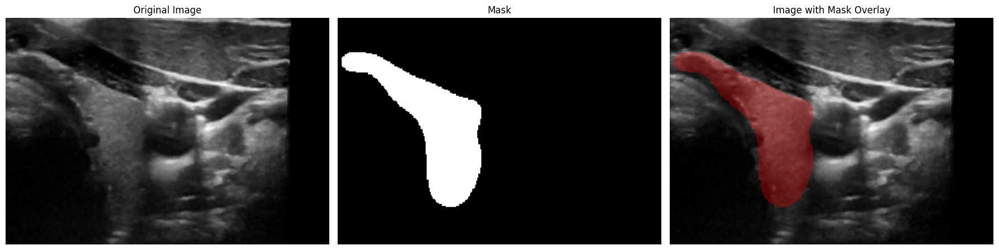

In [ ]:
def visualize_image_mask_pair(img_t:torch.Tensor,mask_t:torch.Tensor) -> None:
    """
    Visualizes an image numpy array, its corresponding mask numpy array, and an overlay.
    Expects single-channel image and mask numpy arrays (H, W).

    """
    # Denormalize image: (x * std + mean) * 255.0 for original scale
    # Assuming mean=0.5, std=0.25 from Normalize transform
    print(np.max(img_t.squeeze().cpu().numpy()))
    img_np = (img_t.squeeze().cpu().numpy() * 0.25 + 0.5) * 255.0
    mask_np = mask_t.squeeze().cpu().numpy()
    print(np.unique(mask_t))

    # Ensure uint8 for visualization


    # Create an overlay: original image + mask in red
    # Convert grayscale image to 3-channel for overlay
    img_color = cv2.cvtColor(img_np, cv2.COLOR_GRAY2BGR)
    # Where mask is 1 (or 255 after scaling), set red channel high
    overlay = img_color.copy()
    overlay[mask_np > 0] = [255, 0, 0] # Red color for mask (BGR format)

    # Blend the overlay with the original image
    alpha = 0.3 # Transparency factor
    blended_overlay = cv2.addWeighted(img_color, 1 - alpha, overlay, alpha, 0)
    blended_overlay = blended_overlay.astype(np.uint8) # Convert to uint8 to avoid warning

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(img_np, cmap='gray')
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(mask_np, cmap='gray')
    axes[1].set_title('Mask')
    axes[1].axis('off')

    axes[2].imshow(blended_overlay)
    axes[2].set_title('Image with Mask Overlay')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()
img_t, mask_t, meta = train_ds[0]
visualize_image_mask_pair(img_t, mask_t)

In [ ]:
class DoubleConv(nn.Module):
    """(Conv2d -> BN -> ReLU) * 2"""

    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if mid_channels is None:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.double_conv(x)


class Down(nn.Module):
    """Downscaling with MaxPool then DoubleConv"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.MaxPool2d(kernel_size=2, stride=2),
            DoubleConv(in_channels, out_channels),
        )

    def forward(self, x):
        return self.block(x)


class Up(nn.Module):
    """Upscaling then DoubleConv"""

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(
                in_channels, in_channels // 2, kernel_size=2, stride=2
            )
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        # x1: from previous decoder level
        # x2: from encoder skip connection
        x1 = self.up(x1)

        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = nn.functional.pad(
            x1,
            [diffX // 2, diffX - diffX // 2,
             diffY // 2, diffY - diffY // 2],
        )

        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class OutConv(nn.Module):
    """Final 1x1 convolution to produce output channels"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)


class UNet2D(nn.Module):
    def __init__(self, in_channels=1, out_channels=1, base_channels=32, bilinear=True):
        super().__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.bilinear = bilinear
        self.base_channels = base_channels

        self.inc = DoubleConv(in_channels, base_channels)
        self.down1 = Down(base_channels, base_channels * 2)
        self.down2 = Down(base_channels * 2, base_channels * 4)
        self.down3 = Down(base_channels * 4, base_channels * 8)
        self.down4 = Down(base_channels * 8, base_channels * 8)

        self.up1 = Up(base_channels * 16, base_channels * 4, bilinear)
        self.up2 = Up(base_channels * 8, base_channels * 2, bilinear)
        self.up3 = Up(base_channels * 4, base_channels, bilinear)
        self.up4 = Up(base_channels * 2, base_channels, bilinear)

        self.outc = OutConv(base_channels, out_channels)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)

        x = self.up1(x5, x4)
        x = self.up2(x,  x3)
        x = self.up3(x,  x2)
        x = self.up4(x,  x1)

        logits = self.outc(x)
        return logits


model = UNet2D(in_channels=1, out_channels=1, base_channels=32, bilinear=True)
model = model.to(device)
print(model)

UNet2D(
  (inc): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (down1): Down(
    (block): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          

In [ ]:
bce_loss_fn = nn.BCEWithLogitsLoss()

def dice_loss_from_logits(logits: torch.Tensor, targets: torch.Tensor, eps: float = 1e-6) -> torch.Tensor:
    """
    Soft Dice loss computed from logits and target masks in {0,1}.
    Args:
        logits:  (B, 1, H, W)
        targets: (B, 1, H, W) in {0,1}
    """
    probs = torch.sigmoid(logits)
    # Flatten per batch
    probs_flat = probs.view(probs.size(0), -1)
    targets_flat = targets.view(targets.size(0), -1)

    intersection = (probs_flat * targets_flat).sum(dim=1)
    union = probs_flat.sum(dim=1) + targets_flat.sum(dim=1)

    dice = (2.0 * intersection + eps) / (union + eps)
    return 1.0 - dice.mean()


def combined_segmentation_loss(logits: torch.Tensor, targets: torch.Tensor, lambda_dice: float = 1.0) -> torch.Tensor:
    """
    Combined loss: BCEWithLogits + lambda_dice * DiceLoss
    """
    loss_bce = bce_loss_fn(logits, targets)
    loss_dice = dice_loss_from_logits(logits, targets)
    return loss_bce + lambda_dice * loss_dice


def compute_dice_score(logits: torch.Tensor, targets: torch.Tensor, threshold: float = 0.5, eps: float = 1e-6) -> float:
    """
    Compute foreground Dice coefficient from logits and targets in {0,1}.
    Returns a scalar (mean over batch).
    """
    probs = torch.sigmoid(logits)
    preds = (probs >= threshold).float()

    preds_flat = preds.view(preds.size(0), -1)
    targets_flat = targets.view(targets.size(0), -1)

    intersection = (preds_flat * targets_flat).sum(dim=1)
    union = preds_flat.sum(dim=1) + targets_flat.sum(dim=1)

    dice = (2.0 * intersection + eps) / (union + eps)
    return dice.mean().item()


def compute_iou_score(logits: torch.Tensor, targets: torch.Tensor, threshold: float = 0.5, eps: float = 1e-6) -> float:
    """
    Compute IoU (Jaccard index) from logits and targets in {0,1}.
    Returns a scalar (mean over batch).
    """
    probs = torch.sigmoid(logits)
    preds = (probs >= threshold).float()

    preds_flat = preds.view(preds.size(0), -1)
    targets_flat = targets.view(targets.size(0), -1)

    intersection = (preds_flat * targets_flat).sum(dim=1)
    union = preds_flat.sum(dim=1) + targets_flat.sum(dim=1) - intersection

    iou = (intersection + eps) / (union + eps)
    return iou.mean().item()

In [ ]:
model = UNet2D(in_channels=1, out_channels=1, base_channels=32, bilinear=True)
model = model.to(device)
LR = 1e-4
NUM_EPOCHS = 50
PATIENCE = 10  # epochs without val Dice improvement before early stopping
optimizer = torch.optim.Adam(model.parameters(), lr=LR, weight_decay=1e-5)
print("Optimizer:", optimizer)

Optimizer: Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 1e-05
)


In [ ]:
from tqdm.auto import tqdm
from torch.utils.tensorboard import SummaryWriter

CHECKPOINT_DIR = Path('./checkpoints')
# TensorBoard writer
writer = SummaryWriter(log_dir=CHECKPOINT_DIR / "runs")

USE_PRETRAINED = False
CHECKPOINT_DIR.mkdir(parents=True, exist_ok=True)
best_ckpt_path = CHECKPOINT_DIR / ("unet2d_seg_full_image_best.pth" if USE_PRETRAINED else "unet2d_seg_scratch_best.pth")

best_val_dice = 0.0
epochs_without_improvement = 0

global_step = 0


optimizer = torch.optim.Adam(model.parameters(), lr=LR)
for epoch in range(1, NUM_EPOCHS + 1):
    # -------------------------
    # Training phase
    # -------------------------
    model.train()
    train_loss_sum = 0.0
    train_batches = 0

    # The tqdm progress bar is wrapped in a train_loader layer.
    train_pbar = tqdm(train_loader, desc=f"Epoch {epoch:02d} [train]", leave=False)
    for batch in train_pbar:
        imgs, masks, meta = batch
        imgs = imgs.to(device)   # (B, 1, H, W)
        masks = masks.to(device) # (B, 1, H, W)

        optimizer.zero_grad()

        logits = model(imgs)
        loss = combined_segmentation_loss(logits, masks, lambda_dice=0.2)

        loss.backward()
        optimizer.step()

        train_loss_sum += loss.item()
        train_batches += 1
        global_step += 1

        avg_batch_loss = train_loss_sum / train_batches

        # Update the loss displayed on the progress bar.
        train_pbar.set_postfix({"loss": f"{avg_batch_loss:.4f}"})

        # TensorBoard: Records training loss step by step.
        writer.add_scalar("train/loss_step", loss.item(), global_step)

    avg_train_loss = train_loss_sum / max(1, train_batches)
    writer.add_scalar("train/loss_epoch", avg_train_loss, epoch)

    # -------------------------
    # Validation phase
    # -------------------------
    model.eval()
    val_loss_sum = 0.0
    val_batches = 0
    val_dice_sum = 0.0
    val_iou_sum = 0.0

    with torch.no_grad():
        val_pbar = tqdm(val_loader, desc=f"Epoch {epoch:02d} [val]", leave=False)
        for batch in val_pbar:
            imgs, masks, meta = batch
            imgs = imgs.to(device)
            masks = masks.to(device)

            logits = model(imgs)
            loss = combined_segmentation_loss(logits, masks, lambda_dice=0.2)

            val_loss_sum += loss.item()
            val_batches += 1

            # metrics
            batch_dice = compute_dice_score(logits, masks)
            batch_iou  = compute_iou_score(logits, masks)

            val_dice_sum += batch_dice
            val_iou_sum  += batch_iou

            avg_val_loss_tmp = val_loss_sum / max(1, val_batches)
            avg_val_dice_tmp = val_dice_sum / max(1, val_batches)

            # The verification progress bar displays the current average value loss / die.
            val_pbar.set_postfix({
                "val_loss": f"{avg_val_loss_tmp:.4f}",
                "val_dice": f"{avg_val_dice_tmp:.4f}",
            })

    avg_val_loss = val_loss_sum / max(1, val_batches)
    avg_val_dice = val_dice_sum / max(1, val_batches)
    avg_val_iou  = val_iou_sum  / max(1, val_batches)

    # TensorBoard: Records validation metrics by epoch.
    writer.add_scalar("val/loss", avg_val_loss, epoch)
    writer.add_scalar("val/dice", avg_val_dice, epoch)
    writer.add_scalar("val/iou",  avg_val_iou,  epoch)
    writer.flush()

    print(
        f"Epoch [{epoch:02d}/{NUM_EPOCHS}] "
        f"- Train loss: {avg_train_loss:.4f} "
        f"- Val loss: {avg_val_loss:.4f} "
        f"- Val Dice: {avg_val_dice:.4f} "
        f"- Val IoU: {avg_val_iou:.4f}"
    )

    # -------------------------
    # Check for improvement (by val Dice)
    # -------------------------
    if avg_val_dice > best_val_dice:
        best_val_dice = avg_val_dice
        epochs_without_improvement = 0
        torch.save(model.state_dict(), best_ckpt_path)
        print(f"  -> New best val Dice: {best_val_dice:.4f}. Saved checkpoint to {best_ckpt_path}")
    else:
        epochs_without_improvement += 1
        print(f"  -> No improvement in Dice for {epochs_without_improvement} epoch(s).")

    # Early stopping
    if epochs_without_improvement >= PATIENCE:
        print(f"Early stopping triggered at epoch {epoch}.")
        break

writer.close()

Epoch 01 [train]:   0%|          | 0/125 [00:00<?, ?it/s]

Epoch 01 [val]:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch [01/50] - Train loss: 0.5979 - Val loss: 0.5420 - Val Dice: 0.6903 - Val IoU: 0.5876
  -> New best val Dice: 0.6903. Saved checkpoint to checkpoints/unet2d_seg_scratch_best.pth


Epoch 02 [train]:   0%|          | 0/125 [00:00<?, ?it/s]

Epoch 02 [val]:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch [02/50] - Train loss: 0.4953 - Val loss: 0.4815 - Val Dice: 0.6054 - Val IoU: 0.5092
  -> No improvement in Dice for 1 epoch(s).


Epoch 03 [train]:   0%|          | 0/125 [00:00<?, ?it/s]

Epoch 03 [val]:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch [03/50] - Train loss: 0.4420 - Val loss: 0.4419 - Val Dice: 0.6978 - Val IoU: 0.6119
  -> New best val Dice: 0.6978. Saved checkpoint to checkpoints/unet2d_seg_scratch_best.pth


Epoch 04 [train]:   0%|          | 0/125 [00:00<?, ?it/s]

Epoch 04 [val]:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch [04/50] - Train loss: 0.3981 - Val loss: 0.3933 - Val Dice: 0.7156 - Val IoU: 0.6224
  -> New best val Dice: 0.7156. Saved checkpoint to checkpoints/unet2d_seg_scratch_best.pth


Epoch 05 [train]:   0%|          | 0/125 [00:00<?, ?it/s]

Epoch 05 [val]:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch [05/50] - Train loss: 0.3602 - Val loss: 0.3730 - Val Dice: 0.6589 - Val IoU: 0.5530
  -> No improvement in Dice for 1 epoch(s).


Epoch 06 [train]:   0%|          | 0/125 [00:00<?, ?it/s]

Epoch 06 [val]:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch [06/50] - Train loss: 0.3306 - Val loss: 0.3598 - Val Dice: 0.6271 - Val IoU: 0.5201
  -> No improvement in Dice for 2 epoch(s).


Epoch 07 [train]:   0%|          | 0/125 [00:00<?, ?it/s]

Epoch 07 [val]:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch [07/50] - Train loss: 0.2991 - Val loss: 0.3105 - Val Dice: 0.7430 - Val IoU: 0.6579
  -> New best val Dice: 0.7430. Saved checkpoint to checkpoints/unet2d_seg_scratch_best.pth


Epoch 08 [train]:   0%|          | 0/125 [00:00<?, ?it/s]

Epoch 08 [val]:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch [08/50] - Train loss: 0.2690 - Val loss: 0.2907 - Val Dice: 0.7393 - Val IoU: 0.6568
  -> No improvement in Dice for 1 epoch(s).


Epoch 09 [train]:   0%|          | 0/125 [00:00<?, ?it/s]

Epoch 09 [val]:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch [09/50] - Train loss: 0.2455 - Val loss: 0.2641 - Val Dice: 0.7249 - Val IoU: 0.6453
  -> No improvement in Dice for 2 epoch(s).


Epoch 10 [train]:   0%|          | 0/125 [00:00<?, ?it/s]

Epoch 10 [val]:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch [10/50] - Train loss: 0.2241 - Val loss: 0.2599 - Val Dice: 0.6959 - Val IoU: 0.6049
  -> No improvement in Dice for 3 epoch(s).


Epoch 11 [train]:   0%|          | 0/125 [00:00<?, ?it/s]

Epoch 11 [val]:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch [11/50] - Train loss: 0.2040 - Val loss: 0.2490 - Val Dice: 0.7009 - Val IoU: 0.6064
  -> No improvement in Dice for 4 epoch(s).


Epoch 12 [train]:   0%|          | 0/125 [00:00<?, ?it/s]

Epoch 12 [val]:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch [12/50] - Train loss: 0.1886 - Val loss: 0.2278 - Val Dice: 0.7172 - Val IoU: 0.6253
  -> No improvement in Dice for 5 epoch(s).


Epoch 13 [train]:   0%|          | 0/125 [00:00<?, ?it/s]

Epoch 13 [val]:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch [13/50] - Train loss: 0.1692 - Val loss: 0.2305 - Val Dice: 0.6893 - Val IoU: 0.5900
  -> No improvement in Dice for 6 epoch(s).


Epoch 14 [train]:   0%|          | 0/125 [00:00<?, ?it/s]

Epoch 14 [val]:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch [14/50] - Train loss: 0.1585 - Val loss: 0.2054 - Val Dice: 0.7222 - Val IoU: 0.6310
  -> No improvement in Dice for 7 epoch(s).


Epoch 15 [train]:   0%|          | 0/125 [00:00<?, ?it/s]

Epoch 15 [val]:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch [15/50] - Train loss: 0.1430 - Val loss: 0.2126 - Val Dice: 0.6797 - Val IoU: 0.5921
  -> No improvement in Dice for 8 epoch(s).


Epoch 16 [train]:   0%|          | 0/125 [00:00<?, ?it/s]

Epoch 16 [val]:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch [16/50] - Train loss: 0.1315 - Val loss: 0.1971 - Val Dice: 0.7109 - Val IoU: 0.6229
  -> No improvement in Dice for 9 epoch(s).


Epoch 17 [train]:   0%|          | 0/125 [00:00<?, ?it/s]

Epoch 17 [val]:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch [17/50] - Train loss: 0.1211 - Val loss: 0.1980 - Val Dice: 0.6998 - Val IoU: 0.6095
  -> No improvement in Dice for 10 epoch(s).
Early stopping triggered at epoch 17.


In [ ]:
%reload_ext tensorboard
%tensorboard --logdir /content/checkpoints/

<IPython.core.display.Javascript object>

In [ ]:
best_ckpt_path = CHECKPOINT_DIR / ("unet2d_seg_mim_best.pth" if USE_PRETRAINED else "unet2d_seg_scratch_best.pth")

# Load best model for full image training
best_ckpt_path = CHECKPOINT_DIR / ("unet2d_seg_full_image_best.pth" if USE_PRETRAINED else "unet2d_seg_scratch_best.pth")

if best_ckpt_path.exists():
    state_dict = torch.load(best_ckpt_path, map_location=device)
    model.load_state_dict(state_dict)
    print("Loaded best segmentation checkpoint from:", best_ckpt_path)
else:
    print("WARNING: Best checkpoint not found, using current model weights.")

model.eval()

test_loss_sum = 0.0
test_batches = 0
test_dice_sum = 0.0
test_iou_sum = 0.0

with torch.no_grad():
    for batch in test_loader:
        imgs, masks, meta = batch
        imgs = imgs.to(device)
        masks = masks.to(device)

        logits = model(imgs)
        loss = combined_segmentation_loss(logits, masks, lambda_dice=0.2)
        test_loss_sum += loss.item()
        test_batches += 1

        batch_dice = compute_dice_score(logits, masks)
        batch_iou  = compute_iou_score(logits, masks)

        test_dice_sum += batch_dice
        test_iou_sum  += batch_iou

avg_test_loss = test_loss_sum / max(1, test_batches)
avg_test_dice = test_dice_sum / max(1, test_batches)
avg_test_iou  = test_iou_sum  / max(1, test_batches)

print("\n=== Test set evaluation ===")
print(f"Test loss: {avg_test_loss:.4f}")
print(f"Test Dice: {avg_test_dice:.4f}")
print(f"Test IoU : {avg_test_iou:.4f}")

Loaded best segmentation checkpoint from: checkpoints/unet2d_seg_scratch_best.pth

=== Test set evaluation ===
Test loss: 0.3060
Test Dice: 0.7708
Test IoU : 0.6871


In [ ]:
model.eval()

all_sample_losses = []
all_sample_metas = []

with torch.no_grad():
    for idx in range(len(test_ds)):
        img, mask, meta = test_ds[idx]

        # Add batch dimension and move to device
        img_t = img.unsqueeze(0).to(device)
        mask_t = mask.unsqueeze(0).to(device)

        logits = model(img_t)
        loss = combined_segmentation_loss(logits, mask_t, lambda_dice=0.2)

        all_sample_losses.append(loss.item())
        all_sample_metas.append(meta)
# Get indices sorted by loss (ascending for best, descending for worst)
# Convert list to numpy array for easy sorting
sorted_indices = np.argsort(all_sample_losses)

# Top 5 best performing (lowest loss)
top_5_best_indices = sorted_indices[:5]
# Top 5 worst performing (highest loss)
top_5_worst_indices = sorted_indices[-5:][::-1] # Reverse to get highest loss first

print("Indices of 5 best performing samples (lowest loss):", top_5_best_indices)
print("Indices of 5 worst performing samples (highest loss):", top_5_worst_indices)

# Retrieve metadata for the best and worst samples
best_sample_metas = [all_sample_metas[i] for i in top_5_best_indices]
worst_sample_metas = [all_sample_metas[i] for i in top_5_worst_indices]

print("\nMetadata for 5 best performing samples:")
for i, meta in enumerate(best_sample_metas):
    print(f"Sample {i+1}: Loss = {all_sample_losses[top_5_best_indices[i]]:.4f}")

print("\nMetadata for 5 worst performing samples:")
for i, meta in enumerate(worst_sample_metas):
    print(f"Sample {i+1}: Loss = {all_sample_losses[top_5_worst_indices[i]]:.4f}")

Indices of 5 best performing samples (lowest loss): [ 19  92 115  43 130]
Indices of 5 worst performing samples (highest loss): [142 144  14 150  86]

Metadata for 5 best performing samples:
Sample 1: Loss = 0.2519
Sample 2: Loss = 0.2521
Sample 3: Loss = 0.2524
Sample 4: Loss = 0.2530
Sample 5: Loss = 0.2538

Metadata for 5 worst performing samples:
Sample 1: Loss = 0.4246
Sample 2: Loss = 0.4234
Sample 3: Loss = 0.4231
Sample 4: Loss = 0.4209
Sample 5: Loss = 0.4185


In [ ]:
import matplotlib.pyplot as plt

def plot_sample(image_np, gt_mask_np, pred_mask_np, title="Sample Visualization"):
    """
    Plots an image, its ground truth mask, predicted mask, and an overlay.
    Args:
        image_np (np.ndarray): Original image (H, W).
        gt_mask_np (np.ndarray): Ground truth mask (H, W).
        pred_mask_np (np.ndarray): Predicted binary mask (H, W).
        title (str): Title for the plot.
    """
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    fig.suptitle(title, fontsize=16)

    # Original Image
    axes[0].imshow(image_np, cmap='gray')
    axes[0].set_title('Input X-ray')
    axes[0].axis('off')

    # Ground Truth Mask
    axes[1].imshow(gt_mask_np, cmap='gray')
    axes[1].set_title('Ground truth mask')
    axes[1].axis('off')

    # Predicted Mask
    axes[2].imshow(pred_mask_np, cmap='gray')
    axes[2].set_title('Predicted mask')
    axes[2].axis('off')

    # Overlay (prediction on original image)
    # Create an RGBA image from the original grayscale image
    overlay_img = cv2.cvtColor(image_np, cv2.COLOR_GRAY2BGR) # Convert to BGR for transparency
    overlay_img = cv2.cvtColor(overlay_img, cv2.COLOR_BGR2RGB)

    # Create a mask for the overlay in red
    red_mask = np.zeros_like(overlay_img, dtype=np.uint8)
    red_mask[pred_mask_np == 1] = [255, 0, 0] # Red for predicted foreground

    # Blend the original image and the red mask
    # Using alpha=0.5 for transparency of the predicted mask
    final_overlay = cv2.addWeighted(overlay_img, 1, red_mask, 0.5, 0)

    axes[3].imshow(final_overlay)
    axes[3].set_title('Overlay (prediction)')
    axes[3].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
    plt.show()

print("plot_sample function defined.")

plot_sample function defined.



Visualizing 5 best performing samples:


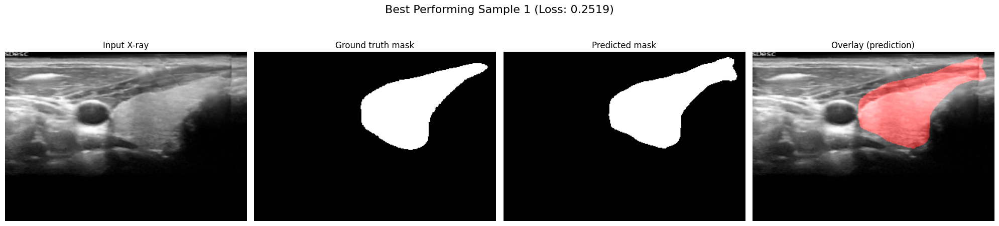

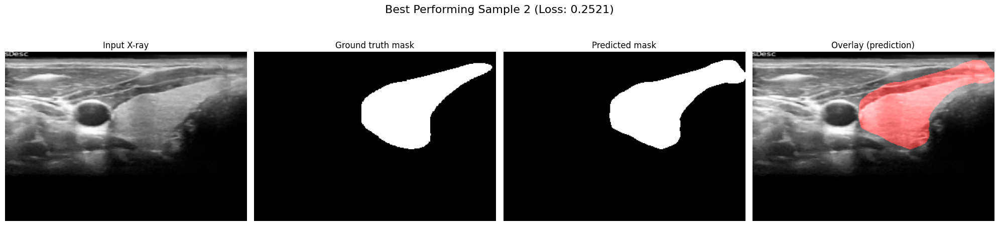

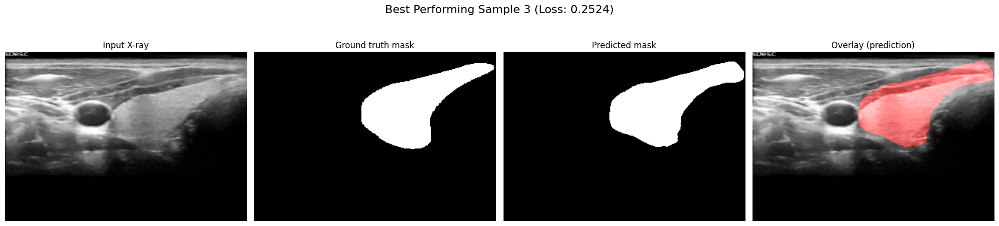

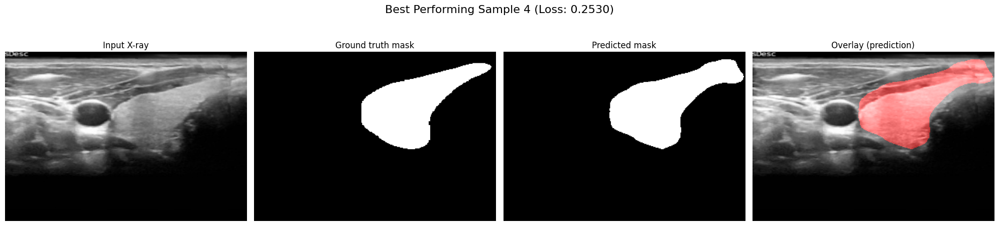

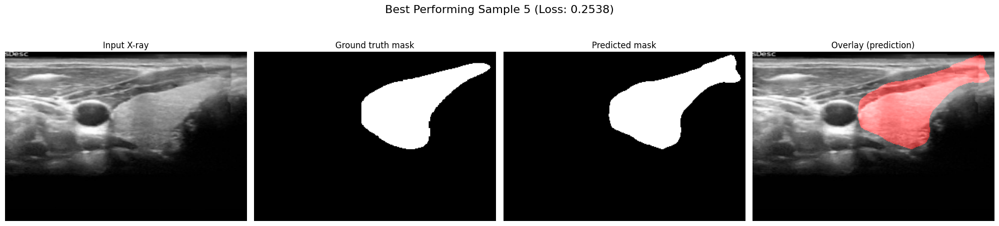


Visualizing 5 worst performing samples:


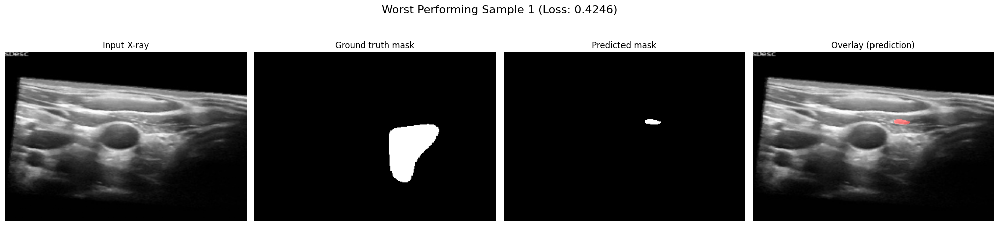

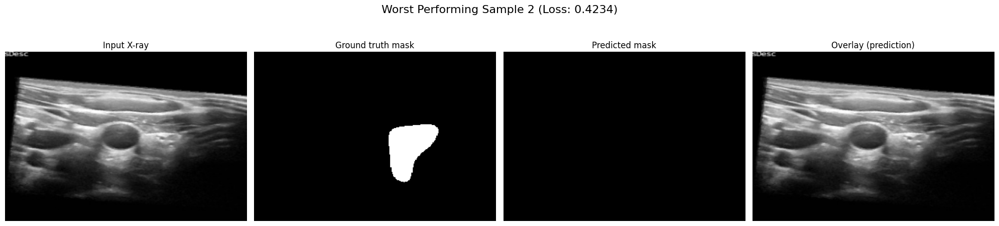

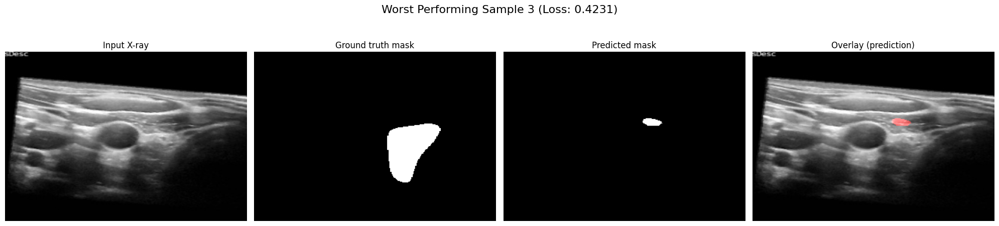

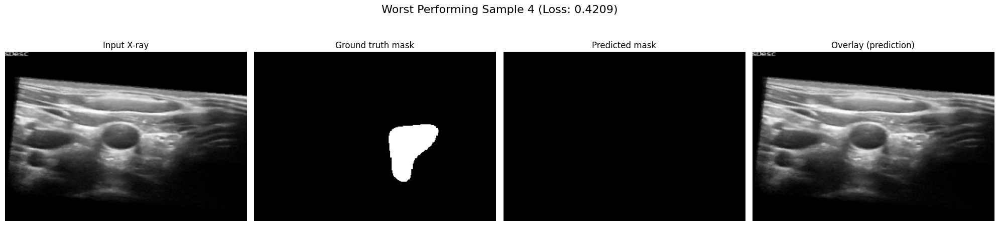

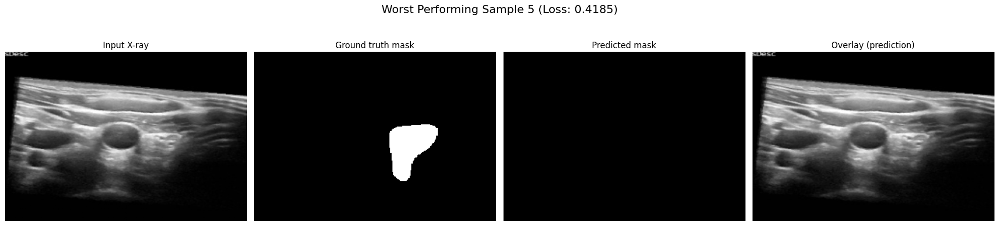

In [ ]:
model.eval()

def visualize_samples(sample_metas, title_prefix):
    # Define a resize transform to ensure the original image is resized for plotting
    resize_transform_only = A.Resize(height=TARGET_HEIGHT, width=TARGET_WIDTH)

    for i, meta in enumerate(sample_metas):
        # 1. Load original image and mask
        img_path = Path(meta['img_path'])
        mask_path = Path(meta['mask_path'])

        original_img_np = load_image_as_array(img_path)
        # original_mask_np = load_mask_as_array(mask_path) # Not directly used for plotting

        # Apply only the resizing component to the original image for visualization
        # This ensures the image displayed has the same dimensions as the masks.
        resized_original_img_for_plot = resize_transform_only(image=original_img_np)['image']

        # 2. Prepare for model input and prediction
        # Find the original index of the sample in test_ds for correct retrieval
        original_idx = all_sample_metas.index(meta)
        img_t_transformed, mask_t_transformed, _ = test_ds[original_idx] # Corrected from val_ds to test_ds

        img_t_transformed = img_t_transformed.unsqueeze(0).to(device) # Add batch dimension

        # Get model prediction
        with torch.no_grad():
            logits = model(img_t_transformed)
            probs = torch.sigmoid(logits)
            predicted_mask_t = (probs > 0.5).float()

        # Convert predicted mask tensor to numpy array for plotting
        predicted_mask_np = predicted_mask_t.squeeze().cpu().numpy() # Remove batch and channel dims

        # Ensure ground truth mask is binarized for consistent plotting (already handled by DentalSegmentationDataset)
        gt_mask_for_plotting = mask_t_transformed.squeeze().cpu().numpy()

        # Get the loss for the current sample to include in the title
        current_sample_loss = all_sample_losses[original_idx]

        # 3. Visualize
        plot_sample(
            resized_original_img_for_plot, # Use the resized original image here
            gt_mask_for_plotting,
            predicted_mask_np,
            title=f"{title_prefix} Sample {i+1} (Loss: {current_sample_loss:.4f})"
        )

# Visualize best performing samples
print("\nVisualizing 5 best performing samples:")
visualize_samples(best_sample_metas, "Best Performing")

# Visualize worst performing samples
print("\nVisualizing 5 worst performing samples:")
visualize_samples(worst_sample_metas, "Worst Performing")